# Shu yang's submission for SC3000 project 1

## INSTRUCTIONS TO RUN THIS CODE (PLEASE SEE)

__This ipynb file requires small changes to 2 lines of code if you use google colab! Otherwise, it works perfectly fine in the jupyter notebook environment__

__The 2 lines of code that needs adjustments are:__

1)In the Q_learning class, under the 'run_episode' function

        #Take the action and then record down the new state, reward and if it is the end state
        #Edit this line if running in google colab
        #Remove the 2nd '_' on the left side
        (SPrime, reward, finished, _, _) = self.env.step(action)
        
        i.e (SPrime, reward, finished, _) = self.env.step(action)
        
2)In the Q_learning class, under the 'run_trained_agent' function

        #Get new parameters for the chosen action
        #Edit this line if running in google colab
        #Remove the 2nd '_' on the left side
        (state, rewardstep, finished, _, _) = env1.step(action)
        
        i.e (state, rewardstep, finished, _) = env1.step(action)
        
        
        
#### The reason why '_' has to be removed is because for some reason, the google colab environment's env.step(action) returns only 4 attributes, but in jupyter notebook it returns 5 attributes.

## Importing dependencies and define helper functions

In [ ]:
!apt-get install -y xvfb python-opengl > /dev/null 2>&1
!pip install gym pyvirtualdisplay > /dev/null 2>&1
!pip install gym pyvirtualdisplay > /dev/null 2>&1
!apt-get install -y xvfb python-opengl ffmpeg > /dev/null 2>&1
!pip install gym[classic_control]
!apt-get update > /dev/null 2>&1
!apt-get install cmake > /dev/null 2>&1
!pip install --upgrade setuptools 2>&1
!pip install ez_setup > /dev/null 2>&1

In [1]:
#(Unchanged from example IPYNB)
import gym
from gym import logger as gymlogger
from gym.wrappers import RecordVideo
gymlogger.set_level(40) #error only
import tensorflow as tf
import numpy as np
import random
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import math
import glob
import io
import base64
from IPython.display import HTML
from IPython import display as ipythondisplay
import math
import time

def show_video():
  mp4list = glob.glob('video/*.mp4')
  if len(mp4list) > 0:
    mp4 = mp4list[0]
    video = io.open(mp4, 'r+b').read()
    encoded = base64.b64encode(video)
    ipythondisplay.display(HTML(data='''<video alt="test" autoplay
                loop controls style="height: 400px;">
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii'))))
  else:
    print("Could not find video")

## Task 1: Development of an RL agent

## Initialise all variables and tables for Q-learning

## Functions of the Q_learning Class

# __1)init constructor__

The init constructor initialises:

1)The cartpole environment

2)The learn rate for the Q-function

3)The gamma (Discount function)

4)Epislon (The exploration/exploitation factor parameter)

5)num_episodes (Number of episodes to run training for)

6)EpisodeRewardSum (A list of the total reward from every episode)

7)q_table (Dictionary storing the Q value. The key is the rounded state values and the value is the Q value)

# __2)rounding__

Rounds the inputted observation values to limit the number of possible states in the Q-table, and returns the rounded observation values

It has to be done by converting it into a list first, rounding the values in the list and converting back into a tuple.

# 3)action_choice

Helper function to help the agent to know which action to choose.

__At episodes below 600:__

Actions chosen will be completely randomised, allowing the the agent to explore its environment and update the Q-Table accordingly

__At 600 < episode < 5000:__

Actions chosen will be based on Epsilon. If the randomly generated value is greater than epsilon, it will use a greedy approach, returning an action based on which action has a higher Q-Value. This allows the Agent to start using it's own experiences in determining the action.

__At 5000 < episode < 12000__

Epsilon will start to decrease, which increases the chance of the agent using it's own learning to determine actions. This is because the agent has gained more experience at this point, but should still have a chance to choose a random action so it can continue exploration and ensure that the agent isnt exploiting or "cheesing" the cart-pole game

__At episodes > 12000__

I decided to completely take epsilon out of the equation, as at this point, due to the Epsilon decay, it has become an insignificant number. SO from episodes 12001 and above, the agent will completely rely on its own training.

# 4)runEpisodes

Function that runs the training phase of the Q_learning agent. It uses action_choice to decide what action to take. It then adds up the reward until the episode terminates and stores all the rewards of the episodes. It does this for numEpisodes times.

Every iteration will reset the environment, check if the state exists in the Q-table (if not initialise it with a random Q-value), perform the action with action_choice and update the Q-value if it is not in a terminal state

# 5)run_trained_agent

Function that takes in an initial state and runs a whole episode with it with the trained q-table, and returns the reward

# 6)return_action

Function that takes in a state and returns the agent's percieved optimal action. Optimal actions are chosen via the greedy method, based on which action has a higher Q-value. 

# 7)convert_to_tuple
Through my experimentations and figuring out the typing of various 'gym' attributes, observation has been a rather tricky one.

It is of a numpy array type, with the inside containing a tuple at index 0 and what i believe to be a dictionary or a string/int at index 1. This results in me needing to convert it into a type which i can work with, that being a tuple. So when an environment is created for the first time, the 1st observation/state will use this function and become a tuple which is easier to work with


## Q-Learning RL agent:

I have decided for this project to implement a Q-Learning algorithm for the cart pole problem.

There are a couple of components to the Q-Learning agent that I will implement step by step. For every state of the environment of every episode, the components of Q-learning are:

**1)Use episilon greedy algorithm to select an action A in state S.**

From the lecture notes and some research online, the epsilon value should be high, which results in the agent choosing actions randomly to learn and explore it's environment. This value of episilon will be decreased as the number of episodes completed increases as the agent gets more experienced. This allows it to rely on it's learning for choosing the action while still leaving a chance for random choices to continued exploration. This is seen in the action_choice function in the Q_Learning class. We will however, experiment with different values of epsilon in order to gauge which value is the best.

**2)Based on the action A chosen in step 1, record down reward R and the next state S'. With these, update the action-value function in the lecture notes:**

~~$ Q_{old}(s_t,a_t) + \alpha (Reward_{t+1} + \gamma max_a(Q_{old}(s_{t+1},a)) - Q(s_t,a_t))$~~

$\alpha$ is the learning rate selected by the user and $\gamma$ is the discount factor.

This can be seen in the runEpisodes class, where the Q value is updated for every action taken.

## The "Infinite state" problem

The cart's poisitioning is a continous value which can be infinitely different values (e.g 1.0000 and 1.00001 are different states). This is not realisitic to store, as our dictionary will be way too large to accept so many different states. This is not to mention that there will be a lot of potential key value errors!

As a result, there is a need to round the 4 parameters of the cart to a value, which limits the number of possible states. One possible way we can round without generalising the states too much will be rounding position and angle to 0.1 and 0.01 respectively. For velocity and angular velocity, we will round them to the nearest whole number.



In [2]:
class Q_learning:

  def __init__(self, env, learn_rate, gamma, epsilon, num_episodes):
    self.env = env
    self.learn_rate = learn_rate
    self.gamma = gamma
    self.epsilon = epsilon
    self.num_episodes = num_episodes
    self.episodeRewardSum = []
    #Initialise a dictionary for observations and Action

    #Associates observation and action with a Q-value float
    self.q_table : Dict[Tuple[observation,int],float] = dict()

  #rounds observations to ensure a finite number of states
  @staticmethod
  def rounding(observation):
      #Create a temporary list and use it to round the value
      if (isinstance(observation, tuple) and isinstance(observation[0], np.ndarray)):
        temp_tuple = Q_learning.convert_to_tuple(_, observation)
        observation = temp_tuple
        
      temp_list = []
      value1 = observation[0] 
      value2 = observation[1]  
      value3 = observation[2]
      value4 = observation[3] 

      temp_list.append(round(value1, 1)) 
      temp_list.append(round(value2, 0)) 
      temp_list.append(round(value3, 2))  
      temp_list.append(round(value4, 0))
      
      #turn the list into a tuple and return it
      rounded_observation_tuple = tuple(temp_list)  
    
      return rounded_observation_tuple


  def action_choice(self, observation, current_episode):

      observation = Q_learning.rounding(observation)
        
      #So for the first 600 episodes, action choices are random
      if (current_episode < 600):
        return np.random.randint(2)

      #after 600 episodes, start using epsilon as the basis for choice making. Either random or greedy Q-value
      #As explained above, epsilon value at the start will be extremly high. This lets the agent choose actions randomly and see how it affects its rewards and environment
      #randNum will be compared with the epsilon value, if greater than, use greedy Q-value. Else random choice
      randNum = np.random.random()

      #But before that, past a certain number of episodes, we want to decrease the epsilon value as the agent has more experience
      if (current_episode > 5000):
        #We decrease episolon value by 1% of it's current value for every episode after the 5000th
        self.epsilon = self.epsilon * 0.99

      if (current_episode > 12000):
    
        #If action 0 has a higher Q-value, return it as the optimal action
        if (self.q_table[((observation), 0)] > self.q_table[((observation), 1)]):
          return 0
        #otherwise, if both are same value or action 1 has higher q value
        else:
          return 1

      if (randNum > self.epsilon):
        #If action 0 has a higher Q-value, return it as the optimal action
        if (self.q_table[(observation, 0)] > self.q_table[(observation, 1)]):
          return 0
        #otherwise, if both are same value or action 1 has higher q value
        else:
          return 1
      #if epsilon is bigger, then random choice
      else:
        return np.random.randint(2)


  def runEpisodes(self, display):
    for EpisodeCount in range(self.num_episodes):
      #Create a list to store the rewards for every single episode
      rewardSum = []

      #new episode, reset environment
      observation = self.env.reset()
     

      if (display):
        print("Running episode {}".format(EpisodeCount))
        
      counter = 1
    
      #Start the episode
      finished = False
      while not finished and counter <= 500:

        #This is the index of the resetted observation in the Q table
        Q_index = Q_learning.rounding(observation)

        #Select the action based on the current episode and the state
        action = self.action_choice(observation, EpisodeCount)

        #Take the action and then record down the new state, reward and if it is the end state
        #Edit this line if running in google colab
        #Remove the 2nd '_' on the left side
        (SPrime, reward, finished, _, _) = self.env.step(action)

        rewardSum.append(reward)
    
        #Get the index of SPrime
        SPrimeIndex = Q_learning.rounding(SPrime)



        #If the state doesnt already exist in the q_table, add it in with a value of 0 (As it doesnt matter)
        if (SPrimeIndex, 0) not in self.q_table:
            self.q_table[(SPrimeIndex, 0)] = 0  # Initialize with some default value
        if (SPrimeIndex, 1) not in self.q_table:
            self.q_table[(SPrimeIndex, 1)] = 0  # Initialize with some default value

        #Get the max Q-value for SPrime to update Q-table with
        SPrimeMax = max(self.q_table[(SPrimeIndex, 0)], self.q_table[(SPrimeIndex, 1)])

        #If the state doesnt already exist in the q_table, add it in with a value of 0 (As it doesnt matter)
        if (Q_index, 0) not in self.q_table:
            self.q_table[(Q_index, 0)] = 0  # Initialize with some default value
        if (Q_index, 1) not in self.q_table:
            self.q_table[(Q_index, 1)] = 0  # Initialize with some default value

        #Now utilise the Q-Learning Formula
        if not finished:
          newQ = self.q_table[(Q_index, action)] + self.learn_rate * (reward + self.gamma * SPrimeMax - self.q_table[(Q_index, action)])
          self.q_table[(Q_index, action)] = newQ
        else:
          #Terminal state reached, SPrimeMax is 0, as terminal states have a Q value of 0
          newQ = self.q_table[(Q_index, action)] + self.learn_rate * (reward - self.q_table[(Q_index, action)])
          self.q_table[(Q_index, action)] = newQ
        
        #Now finally update the original observation (State S) with State S Prime
        observation = SPrime
        counter += 1
      
      #Function to 
      if (display):
        print("Total Reward for this Episode: {}".format(np.sum(rewardSum)))
        self.episodeRewardSum.append(np.sum(rewardSum))

        
  #Runs 1 single episode with a randomly generated start state
  def run_trained_agent(self, render):
    if render:
      env1 = gym.make('CartPole-v1',render_mode='human')
    else:
      env1 = gym.make('CartPole-v1')

    #generate random starting state
    state = env1.reset()

    reward = 0
    finished = False
    counter = 1
    
    while not finished and counter <= 500:
      #round the index
      index = Q_learning.rounding(state)

      #if action 1 has a higher q value, choose it as the optimal action for that state
      if (self.q_table[(index, 1)] > self.q_table[(index, 0)]):
        action = 1
      else:
        action = 0

      #Get new parameters for the chosen action
      #Edit this line if running in google colab
      #Remove the 2nd '_' on the left side
      (state, rewardstep, finished, _, _) = env1.step(action)

      reward += rewardstep
      counter += 1
    return reward

  #Function to return the optimal action based on the Q-table
  def return_action(self, observation):
    index = Q_learning.rounding(observation)
    if (self.q_table[(index, 1)] > self.q_table[(index, 0)]):
      return 1
    else:
      return 0

  #Convert gym's observation from a numpy array to a tuple for easier manipulation
  def convert_to_tuple(self, observation):
    value1 = observation[0][0]
    value2 = observation[0][1]
    value3 = observation[0][2]
    value4 = observation[0][3]
    
    temp_tuple = (value1, value2, value3, value4)
    
    return temp_tuple

  def return_optimal_action(self, observation):

      #Round the state
      state = self.rounding(observation)
      #If action 0 has a higher Q-Value, then it is more optimal. Otherwise, action 1 is more optimal.
      if (Q_Learn.q_table[(state, 0)] > Q_Learn.q_table[(state, 1)]):
        return 0
      else:
        return 1


# Q-Learning demonstration

Below we will run train the Q-Learning agent with 50k episodes 3 seperate times, each with 3 different parameters. This is to ascertain and gain the best possible combination of values to get the best agent.

The first agent will have a learning rate of 0.1, epsilon of 0.5 and a gamma of 0.99. We will mostly be tweaking the exploration rate, epsilon.


In the cart pole problem, the actions are mostly deterministic as given a set of parameters, it can be roughly predicted what effect a push will have on the cart and pole. And since the cart pole problem lasts for at most 500 actions, it needs the agent to plan for long term, which is why a high gamma is appropriate and will not be tweaked.

Learning rate should be low as there are a lot of episodes and actions being done, and we need to avoid having the agent reacting strongly to any singular event and affecting it's learning.

### Training process:

##### 1)runEpisodes creates a new initial state with env.reset, and initialises a counter 

#### 2)While runEpisodes total number of episodes ran is below numberOfEpisodes, it will call action_choice to choose an action for the agent to take. 

At < 600 episodes, choose completely random actions

At 600 < episodes < 5000, choose action randomly if the randomly generated value is < epsilon, or use Q-table if it is greater.

At episodes < 5000, start decreasing epsilon value by 1% of its current value every loop

at episodes <12000, fully depend on own Q-table

#### 3)After taking an action, update current state and check if terminal state has been reached. We will use the module's default terminal state checker env.step() as the assignment's terminal state and module's terminal state is the same (except for terminating at 500 actions)

#### 4)Update Q-table and the reward gained accordingly and repeat until episode terminates.

#### 5)Repeat step 1 to 4 numberOfEpisodes times

# Version 1:

__Epsilon: 0.5__

Total episodes: 50 000

For all these versions, they utilise the Q-Learning class previously. They will always reset the observations for every new episode and start at a random state.

In [3]:
learning_rate = 0.1
epsilon = 0.5
numberOfEpisodes = 50000
gamma = 0.99
env=gym.make('CartPole-v1')
#Create the q_learning object
Q_Learn = Q_learning(env, learning_rate, gamma, epsilon, numberOfEpisodes)
#Set this to True if you want to see each individual episode's reward (SPAM WARNING)
#Takes about 8 minutes to run on my low end laptop
Q_Learn.runEpisodes(True)

Running episode 0
Total Reward for this Episode: 18.0
Running episode 1
Total Reward for this Episode: 57.0
Running episode 2
Total Reward for this Episode: 35.0
Running episode 3
Total Reward for this Episode: 14.0
Running episode 4
Total Reward for this Episode: 47.0
Running episode 5
Total Reward for this Episode: 12.0
Running episode 6
Total Reward for this Episode: 21.0
Running episode 7
Total Reward for this Episode: 14.0
Running episode 8
Total Reward for this Episode: 19.0
Running episode 9
Total Reward for this Episode: 22.0
Running episode 10
Total Reward for this Episode: 12.0
Running episode 11
Total Reward for this Episode: 23.0
Running episode 12
Total Reward for this Episode: 37.0
Running episode 13
Total Reward for this Episode: 19.0
Running episode 14
Total Reward for this Episode: 15.0
Running episode 15
Total Reward for this Episode: 25.0
Running episode 16
Total Reward for this Episode: 18.0
Running episode 17
Total Reward for this Episode: 37.0
Running episode 18
T

C:\Users\Huang ShuYang\AppData\Local\Programs\Python\Python310\lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Total Reward for this Episode: 47.0
Running episode 76
Total Reward for this Episode: 26.0
Running episode 77
Total Reward for this Episode: 13.0
Running episode 78
Total Reward for this Episode: 13.0
Running episode 79
Total Reward for this Episode: 10.0
Running episode 80
Total Reward for this Episode: 36.0
Running episode 81
Total Reward for this Episode: 23.0
Running episode 82
Total Reward for this Episode: 53.0
Running episode 83
Total Reward for this Episode: 28.0
Running episode 84
Total Reward for this Episode: 28.0
Running episode 85
Total Reward for this Episode: 10.0
Running episode 86
Total Reward for this Episode: 26.0
Running episode 87
Total Reward for this Episode: 40.0
Running episode 88
Total Reward for this Episode: 13.0
Running episode 89
Total Reward for this Episode: 30.0
Running episode 90
Total Reward for this Episode: 16.0
Running episode 91
Total Reward for this Episode: 26.0
Running episode 92
Total Reward for this Episode: 16.0
Running episode 93
Total Rewa

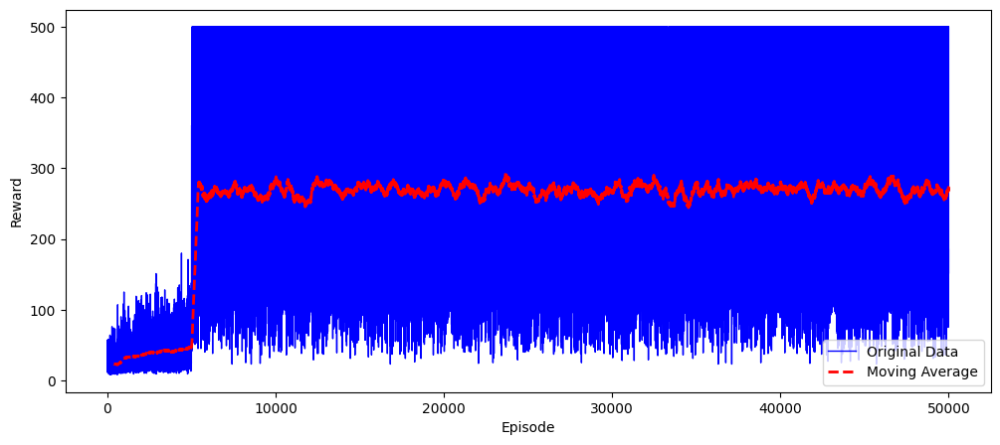

In [4]:
window_size = 400  
moving_avg = np.convolve(Q_Learn.episodeRewardSum, np.ones(window_size)/window_size, mode='valid')

plt.figure(figsize=(12, 5))
plt.plot(Q_Learn.episodeRewardSum, color='blue', linewidth=1, label='Original Data')
plt.plot(np.arange(window_size-1, len(Q_Learn.episodeRewardSum)), moving_avg, color='red', linestyle='--', linewidth=2, label='Moving Average')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.legend()
plt.show()

In [5]:
print("Average reward of each episode: ", np.mean(Q_Learn.episodeRewardSum))

Average reward of each episode:  246.10762


__We can very clearly see a huge spike in performance after 5000 episodes have gone by and the agent is allowed to start using what it has learnt in it's decision making. However, as we can see from the moving average, it stagnates at around 350 rewards. My understanding is that the agent stops learning and exploring at this point and is fully reliant on it's own training, as the epsilon value is extremly small at this point which results in  no random exploration. The variations of the episodes are large, with a large number of them hitting 500 rewards and others not even hitting 100. With an average of 300 reward, this agent performs relatively well__

# Version 2:

__Epsilon: 0.33__

Total episodes: 50 000

In [12]:
learning_rate2 = 0.1
epsilon2 = 0.33
numberOfEpisodes = 50000
gamma2 = 0.99
env2=gym.make('CartPole-v1')
#Create the q_learning object
Q_Learn2 = Q_learning(env2, learning_rate2, gamma2, epsilon2, numberOfEpisodes)
#Set this to True if you want to see each individual episode's reward (SPAM WARNING)
#Takes about 8 minutes to run on my low end laptop
Q_Learn2.runEpisodes(True)


Running episode 0
Total Reward for this Episode: 12.0
Running episode 1
Total Reward for this Episode: 20.0
Running episode 2
Total Reward for this Episode: 16.0
Running episode 3
Total Reward for this Episode: 32.0
Running episode 4
Total Reward for this Episode: 12.0
Running episode 5
Total Reward for this Episode: 24.0
Running episode 6
Total Reward for this Episode: 13.0
Running episode 7
Total Reward for this Episode: 19.0
Running episode 8
Total Reward for this Episode: 11.0
Running episode 9
Total Reward for this Episode: 10.0
Running episode 10
Total Reward for this Episode: 24.0
Running episode 11
Total Reward for this Episode: 12.0
Running episode 12
Total Reward for this Episode: 51.0
Running episode 13
Total Reward for this Episode: 23.0
Running episode 14
Total Reward for this Episode: 17.0
Running episode 15
Total Reward for this Episode: 32.0
Running episode 16
Total Reward for this Episode: 27.0
Running episode 17
Total Reward for this Episode: 18.0
Running episode 18
T

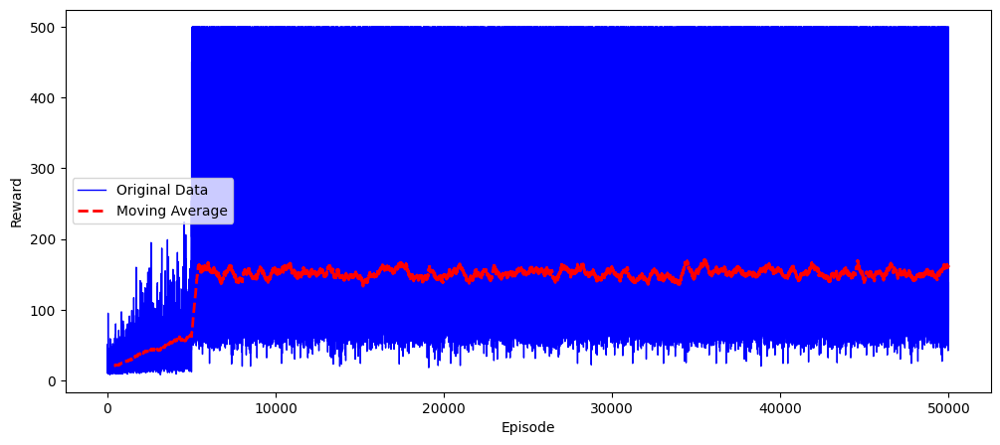

In [28]:
window_size = 400  
moving_avg = np.convolve(Q_Learn2.episodeRewardSum, np.ones(window_size)/window_size, mode='valid')

plt.figure(figsize=(12, 5))
plt.plot(Q_Learn2.episodeRewardSum, color='blue', linewidth=1, label='Original Data')
plt.plot(np.arange(window_size-1, len(Q_Learn.episodeRewardSum)), moving_avg, color='red', linestyle='--', linewidth=2, label='Moving Average')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.legend()
plt.show()


In [14]:
print("Average reward of each episode: ", np.mean(Q_Learn2.episodeRewardSum))

Average reward of each episode:  140.7636


__This agent performs worse thant the first one. While at first it may suggest that 0.33 epsilon value is not a good value for the agent, it is important to keep in mind that these training has an element of luck to them. Through my many tests and rerunning of the code, the average can fluctuate heavily, sometimes not having even 1 episode reach 500 rewards. So with reruns, 0.33 epsilon agent may do as well as the 0.5 epsilon agent, but it is inconsistent.__

# Version 3:

__Epsilon: 0.75__

Total episodes: 50 000

In [25]:

learning_rate3 = 0.1
epsilon3 = 0.75
numberOfEpisodes = 50000
gamma3 = 0.99
env3=gym.make('CartPole-v1')
#Create the q_learning object
Q_Learn3 = Q_learning(env3, learning_rate3, gamma3, epsilon3, numberOfEpisodes)
#Set this to True if you want to see each individual episode's reward (SPAM WARNING)
#Takes about 8 minutes to run on my low end laptop
Q_Learn3.runEpisodes(True)


Running episode 0
Total Reward for this Episode: 12.0
Running episode 1
Total Reward for this Episode: 20.0
Running episode 2
Total Reward for this Episode: 13.0
Running episode 3
Total Reward for this Episode: 13.0
Running episode 4
Total Reward for this Episode: 14.0
Running episode 5
Total Reward for this Episode: 14.0
Running episode 6
Total Reward for this Episode: 22.0
Running episode 7
Total Reward for this Episode: 14.0
Running episode 8
Total Reward for this Episode: 30.0
Running episode 9
Total Reward for this Episode: 13.0
Running episode 10
Total Reward for this Episode: 55.0
Running episode 11
Total Reward for this Episode: 51.0
Running episode 12
Total Reward for this Episode: 16.0
Running episode 13
Total Reward for this Episode: 17.0
Running episode 14
Total Reward for this Episode: 17.0
Running episode 15
Total Reward for this Episode: 19.0
Running episode 16
Total Reward for this Episode: 38.0
Running episode 17
Total Reward for this Episode: 45.0
Running episode 18
T

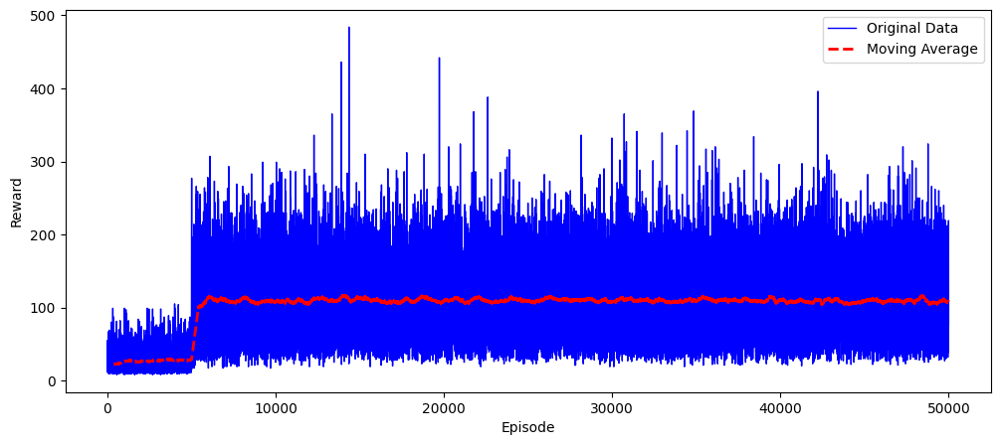

In [26]:
window_size = 400  
moving_avg = np.convolve(Q_Learn3.episodeRewardSum, np.ones(window_size)/window_size, mode='valid')

plt.figure(figsize=(12, 5))
plt.plot(Q_Learn3.episodeRewardSum, color='blue', linewidth=1, label='Original Data')
plt.plot(np.arange(window_size-1, len(Q_Learn.episodeRewardSum)), moving_avg, color='red', linestyle='--', linewidth=2, label='Moving Average')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.legend()
plt.show()


In [27]:
print("Average reward of each episode: ", np.mean(Q_Learn3.episodeRewardSum))

Average reward of each episode:  101.23658


__For the 0.75 agent, it is extremly clear to see that it is performing far worse than the other 2 agents. My best interpretation of this is that for the cart problem, large amounts of random exploration for the cart pole problem is not ideal of a learning style for the agent. It is also consistent in doing poorly, unlike 0.33 epsilon agent which fluctuates heavily between doing well and porly.__

## Conclusion

The best parameters for the Q_Learning agent is learning rate of 0.1, epsilon of 0.5 and gamma of 0.99. This set of parameter has an average reward potential of around 220. However, as mentioned, there will be an element of luck in the result's average as the random nature of the learning phase will influence the accuracy of the rewards. Through my own testings, epsilon value of 0.33 can sometimes beat out the epsilon value of 0.5, so both of them are very effective values for the Q_Learning agent.

The value of 0.7 does very poorly for the cartpole problem consistently, suggesting that high amounts of random exploration isnt effective for this problem. But given that in this case, version 1 did the best, subsequent tasks will be reliant on it.

## Answer to Task 1:

In [18]:
#Answer to task 1:
#Random state
observation = env.reset()
#Get the action from the agent's Q-table
action = Q_Learn.return_optimal_action(observation)

if (isinstance(observation, tuple) and isinstance(observation[0], np.ndarray)):
    temp_tuple = Q_Learn.convert_to_tuple(observation)
    observation = temp_tuple
    
print("Observation: ", observation)
print("Chosen action: ", action)


Observation:  (-0.0036513554, -0.007032168, -0.018145174, -0.0015733398)
Chosen action:  0


Given the position of -0.00365 and the angle of -0.01814, the agent's q_value table suggests pushing the cart to the left.

Intuitively, this is the correct suggestion as the pole is tilted to the left, and a leftward push will cause it to start going clockwise, balancing it.

## Task 2: Demonstrate the effectiveness of the RL agent

For this task, use the agent developed in Task 1 to play the game for 100 episodes (refer to tutorial for how to play a round), record the cumulative reward for each round, and plot the reward for each round. A sample plotting code is given below. Note that you must include code to play for 100 episodes and use the code to obtain round_results for plotting. DO NOT record the round results in advance and paste the results to the notebook.

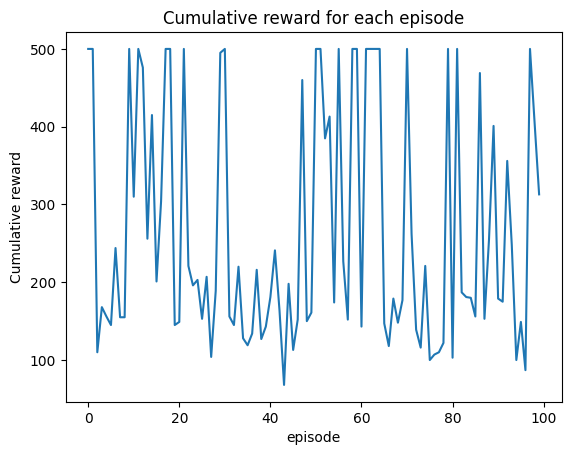

In [19]:
#There is a small chance that there will be a Value-error
#There is due to the randomly generated starting state not being in the Q-Table.
#This is however, extremly rare as we have 50000 different episodes

#Create a list to store the rewards for each episode
episode_results = []

#Run Q_learning class's run_trained_agent 100 times and collect the results of each episode
#Recap:run_trained_agent runs 1 single episode with a random start state and returns the reward of that episode
for i in range (100):
    reward_sum = 0
    reward_sum = Q_Learn.run_trained_agent(False)
    episode_results.append(reward_sum)

plt.plot(episode_results)
plt.title('Cumulative reward for each episode')
plt.ylabel('Cumulative reward')
plt.xlabel('episode')
plt.show()

Print the average reward over the 100 episodes.

In [20]:
print("Average cumulative reward:", np.mean(episode_results))
print("Is my agent good enough?", np.mean(episode_results) > 195)

Average cumulative reward: 264.71
Is my agent good enough? True


## Task 3: Render one episode played by the agent

Plug your agent to the code below to obtain rendered result.

## Video player 1: Jupyter-notebook specific

In [21]:
env = RecordVideo(gym.make("CartPole-v1", render_mode="rgb_array"), "./video")

observation = env.reset()
observation = Q_Learn.rounding(observation)
env.start_video_recorder()

done = False
while True:

    #your agent goes here
    action = Q_Learn.return_action(observation)

    (observation, reward, done, info, _) = env.step(action)
    if done:
      break;
env.close()
show_video()

Moviepy - Building video C:\Users\Huang ShuYang\OneDrive\Desktop\NTU Course Stuff\Y2S2\SC3000\video\rl-video-episode-0.mp4.
Moviepy - Writing video C:\Users\Huang ShuYang\OneDrive\Desktop\NTU Course Stuff\Y2S2\SC3000\video\rl-video-episode-0.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\Huang ShuYang\OneDrive\Desktop\NTU Course Stuff\Y2S2\SC3000\video\rl-video-episode-0.mp4
Moviepy - Building video C:\Users\Huang ShuYang\OneDrive\Desktop\NTU Course Stuff\Y2S2\SC3000\video\rl-video-episode-0.mp4.
Moviepy - Writing video C:\Users\Huang ShuYang\OneDrive\Desktop\NTU Course Stuff\Y2S2\SC3000\video\rl-video-episode-0.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\Huang ShuYang\OneDrive\Desktop\NTU Course Stuff\Y2S2\SC3000\video\rl-video-episode-0.mp4


## Video Player 2: Google Colab Specific

In [ ]:
env = RecordVideo(gym.make("CartPole-v1"), "./video")
observation = env.reset()
while True:
    env.render()
    #your agent goes here
    action = Q_Learn.return_action(observation)
    observation, reward, done, info = env.step(action) 
    if done: 
      break;    
env.close()
show_video()

## Outside resources that I took inspiration from:

https://youtu.be/KMjQmG5Uzis?si=dQGGwwa7kEr-ro9d

Aleksandar Haber's explaination of OpenAI's gym cartpole problem and his implementation of the solution.

I did not copy his code or his work, and his guide only served as a general idea on how Q Learning works.

How our work defers is in the parameters and the implementation of the Q-Table, and how the values are retrieved and the entirety of how we managed gym's observation values

In his video, his Q-tables are split quarterly with the help of "bins" while my implementation simplifies this through the usage of rounding.

I have had to go through the trouble of ensuring and adapting my code to be functional in both google colab and jupyter notebook as well

The general idea however, is the same. Fill up the Q-table, decrease epsilon value as episode count increases and update it with the Q value formula, which are all a part of our lecture notes. All code logic and functions are all done by myself.